In [ ]:
import cv2
import os
import numpy as np
import supervision as sv
import matplotlib.pyplot as plt
from supervision.annotators.utils import ColorLookup


import torch
import torchvision

from groundingdino.util.inference import Model
from segment_anything import sam_model_registry, SamPredictor

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# GroundingDINO config and checkpoint
GROUNDING_DINO_CONFIG_PATH = "GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py"
GROUNDING_DINO_CHECKPOINT_PATH = "./groundingdino_swint_ogc.pth"

# Segment-Anything checkpoint
SAM_ENCODER_VERSION = "vit_h"
SAM_CHECKPOINT_PATH = "./sam_vit_h_4b8939.pth"



# Building GroundingDINO inference model
grounding_dino_model = Model(model_config_path=GROUNDING_DINO_CONFIG_PATH, model_checkpoint_path=GROUNDING_DINO_CHECKPOINT_PATH)

# Building SAM Model and SAM Predictor
sam = sam_model_registry[SAM_ENCODER_VERSION](checkpoint=SAM_CHECKPOINT_PATH)
sam.to(device=DEVICE)
sam_predictor = SamPredictor(sam)

# Wall Ver 1 Final

In [7]:
def filter_small_masks(masks, boxes, image_shape, min_area_ratio=0.1):
    """
    Remove masks that cover less than min_area_ratio (e.g., 10%) of the image area.
    
    masks: list of binary np.arrays
    boxes: np.array (N, 4)
    image_shape: tuple (H, W)
    min_area_ratio: float, e.g., 0.1 for 10%
    """
    H, W = image_shape
    image_area = H * W
    keep = []

    for i, mask in enumerate(masks):
        mask_area = np.sum(mask.astype(bool))
        if mask_area / image_area >= min_area_ratio:
            keep.append(i)

    filtered_masks = [masks[i] for i in keep]
    filtered_boxes = boxes[keep]

    return filtered_masks, filtered_boxes

def filter_noisy_masks(masks, boxes, max_components=30, min_component_area=5):
    """
    Removes masks with too many isolated components (small blobs).

    masks: list of binary masks
    boxes: np.array (N, 4)
    max_components: maximum allowed number of connected components 
    min_component_area: ignore very tiny components (likely noise)
    """
    clean_masks = []
    clean_boxes = []

    for mask, box in zip(masks, boxes):
        # Convert to uint8
        mask_uint8 = (mask.astype(np.uint8) * 255)

        # Get connected components
        num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask_uint8, connectivity=8)
        
        # Count components above area threshold
        valid_components = sum(stat[cv2.CC_STAT_AREA] > min_component_area for stat in stats[1:])  # skip background

        # print("valid_components", valid_components)

        if valid_components <= max_components:
            # pass
            clean_masks.append(mask)
            clean_boxes.append(box)

    return clean_masks, np.array(clean_boxes)


def remove_masks_that_contain_others(masks, boxes, threshold=0.9):
    """
    masks: List of binary numpy arrays (H, W)
    boxes: np.array of shape (N, 4), bbox coordinates
    threshold: overlap ratio threshold to consider one mask inside another
    """
    num_masks = len(masks)
    keep = np.ones(num_masks, dtype=bool)

    for i in range(num_masks):
        for j in range(num_masks):
            if i == j or not keep[i] or not keep[j]:
                continue

            mask_i = masks[i].astype(bool)
            mask_j = masks[j].astype(bool)

            # Area of each mask
            area_i = np.sum(mask_i)
            area_j = np.sum(mask_j)

            # Overlap area
            intersection = np.logical_and(mask_i, mask_j).sum()

            # Check if j is mostly inside i and i is larger
            if intersection / area_j > threshold and area_i > area_j:
                keep[i] = False  # Remove the larger container mask

    # Filter masks and boxes
    filtered_masks = [m for k, m in zip(keep, masks) if k]
    filtered_boxes = boxes[keep]

    return filtered_masks, filtered_boxes


def sample_random_points_from_mask(mask, num_points=1, seed=None):
    """
    Randomly sample points from a binary mask.
    
    Parameters:
        mask (np.ndarray): Binary mask of shape (H, W)
        num_points (int): Number of points to sample
        seed (int, optional): Seed for reproducibility

    Returns:
        List of (x, y) tuples for sampled points
    """
    if seed is not None:
        np.random.seed(seed)

    # Get all coordinates where mask is True (i.e., 1 or non-zero)
    ys, xs = np.where(mask > 0)

    if len(xs) == 0:
        return []  # No valid points in the mask

    indices = np.random.choice(len(xs), size=min(num_points, len(xs)), replace=False)
    sampled_points = [(xs[i], ys[i]) for i in indices]

    return sampled_points


D:\3d-recon\MoGe\ASARoomImage\b01.jpg
walls_bbox [[6.7338000e+02 7.2439575e-01 9.9824670e+02 6.6525513e+02]
 [3.5033905e+02 3.3968280e+02 6.7527899e+02 6.3357855e+02]
 [3.5200616e+02 2.6283264e-01 6.7526276e+02 2.5938544e+02]]
selected_wall_points [[843, 327], [591, 534], [512, 128]]


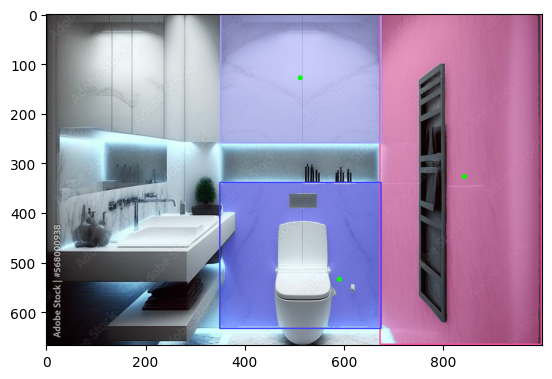

D:\3d-recon\MoGe\ASARoomImage\b02.jpg
walls_bbox [[1.06744348e+03 1.04022217e+00 1.49508850e+03 1.38881616e+03]
 [4.96811951e+02 2.02938965e+02 5.83777283e+02 1.00485437e+03]
 [7.72624390e+02 2.42223724e+02 1.07972864e+03 9.72870972e+02]
 [1.38556320e+02 7.63042908e+01 5.76541443e+02 1.00626843e+03]]
selected_wall_points [[1317, 557], [543, 548], [949, 608], [321, 389]]


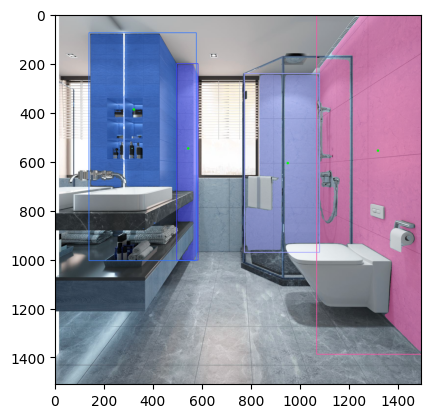

D:\3d-recon\MoGe\ASARoomImage\b04.jpg
walls_bbox [[7.1832239e+02 1.9024658e-01 8.8592175e+02 8.6527960e+02]
 [3.2946815e+01 7.0880646e+01 2.5321893e+02 8.0391760e+02]
 [8.5992813e-02 3.7767365e+01 3.5892891e+01 8.1609778e+02]
 [2.5266122e+02 4.6174683e+02 4.3528140e+02 7.9530383e+02]
 [6.1691711e+02 6.1660126e+01 7.3288611e+02 4.6333841e+02]]
selected_wall_points [[768, 306], [143, 426], [16, 405], [327, 586], [633, 271]]


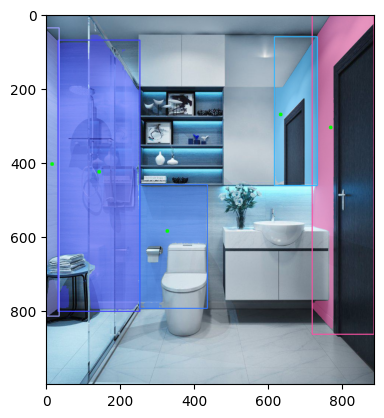

D:\3d-recon\MoGe\ASARoomImage\b06.jpg
walls_bbox [[5.3805780e+02 1.8673706e+00 1.4329250e+03 1.6497625e+03]
 [1.3879700e+00 3.1590292e+02 5.4619104e+02 9.4473901e+02]
 [5.7891846e-01 9.3818091e+02 5.4416406e+02 1.2996250e+03]
 [1.3471299e+03 1.8380737e+00 1.4721812e+03 1.6682720e+03]]
selected_wall_points [[987, 751], [310, 647], [332, 1020], [1417, 844]]


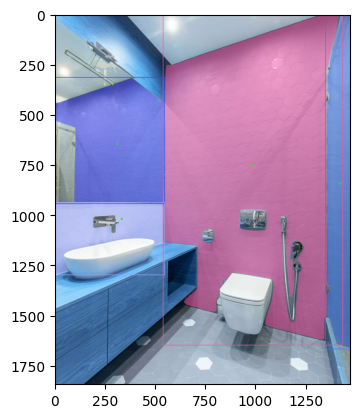

D:\3d-recon\MoGe\ASARoomImage\b07.jpg
walls_bbox [[5.62518311e+00 1.52954102e+00 3.37409943e+02 1.00557275e+03]
 [1.07078406e+03 6.13525391e-01 1.43834802e+03 8.24566650e+02]
 [6.68921143e+02 3.86272766e+02 1.09680859e+03 8.56627747e+02]
 [5.88955566e+02 6.07376099e-01 1.07041724e+03 3.89863586e+02]]
selected_wall_points [[139, 390], [1369, 325], [878, 584], [845, 178]]


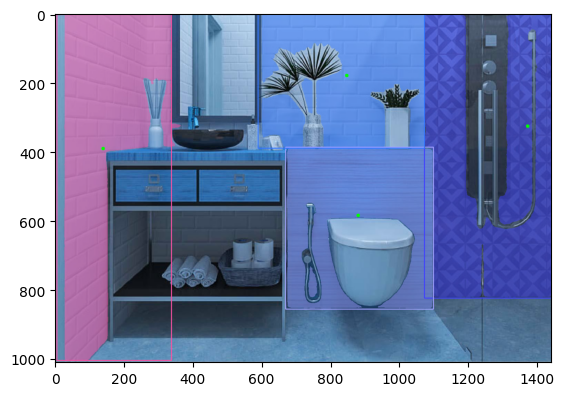

D:\3d-recon\MoGe\ASARoomImage\b09.jpg
walls_bbox [[4.8907269e+02 8.6230469e-01 7.3452069e+02 1.1013599e+03]
 [1.3118781e+02 2.7171021e+00 3.7447665e+02 8.7775421e+02]]
selected_wall_points [[622, 453], [250, 430]]


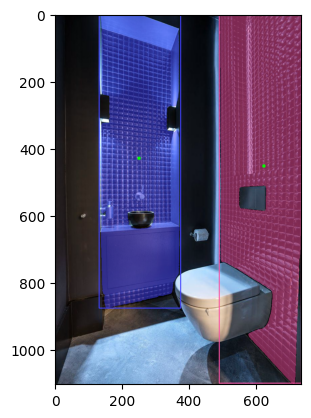

D:\3d-recon\MoGe\ASARoomImage\b10.jpg
walls_bbox [[ 4.9203528e+02 -5.9326172e-02  7.3380225e+02  8.0235803e+02]
 [ 5.1823425e-01  5.9974976e+01  4.1545312e+02  6.3071344e+02]]
selected_wall_points [[636, 339], [92, 225]]


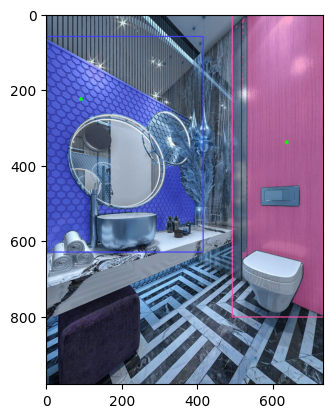

D:\3d-recon\MoGe\ASARoomImage\b11.jpg
walls_bbox [[4.8734528e+02 3.3767700e-01 5.9864423e+02 8.9664136e+02]
 [6.3826752e-01 2.2362143e+02 7.3259895e+01 7.4636548e+02]
 [7.3207031e+01 6.1342291e+02 5.0940125e+02 7.5168231e+02]
 [1.6622728e+02 1.8304073e+02 4.5019855e+02 5.5532416e+02]]
selected_wall_points [[552, 397], [35, 483], [303, 672], [306, 369]]


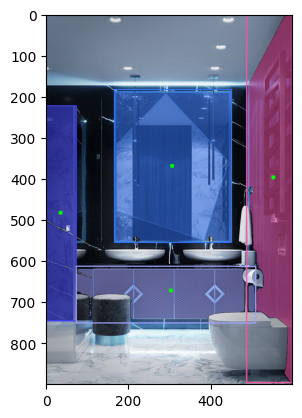

D:\3d-recon\MoGe\ASARoomImage\b12.jpg
walls_bbox [[6.1897131e+02 8.7677002e-01 7.2300977e+02 1.0035676e+03]
 [2.0867455e+01 5.4756824e+02 1.7449527e+02 8.0994958e+02]
 [4.7133490e+02 3.2104962e+02 5.4431464e+02 5.8638342e+02]
 [2.0814368e+02 2.1085361e+02 3.7373303e+02 6.1787122e+02]
 [3.1336914e+01 3.4816544e+02 1.3108936e+02 5.2489734e+02]
 [5.5473486e+02 2.9263577e+02 5.8660046e+02 5.9771790e+02]]
selected_wall_points [[670, 472], [89, 654], [508, 452], [279, 330], [78, 422], [570, 449]]


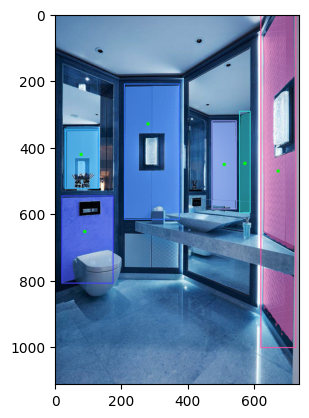

D:\3d-recon\MoGe\ASARoomImage\b13.jpg
walls_bbox [[4.1395016e+02 1.3338928e+00 7.3488000e+02 9.1789380e+02]
 [1.5507292e+02 6.3308716e-01 4.1780493e+02 8.9126831e+02]
 [5.2434540e-01 8.5470581e-01 1.5651086e+02 6.3742957e+02]]
selected_wall_points [[554, 427], [294, 334], [141, 165]]


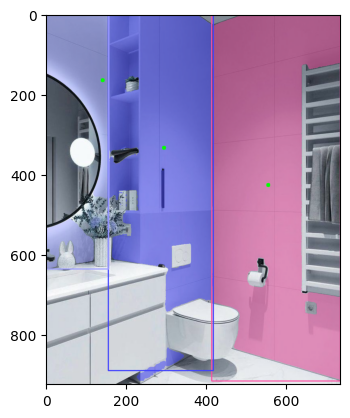

D:\3d-recon\MoGe\ASARoomImage\b14.jpg
walls_bbox [[ 394.04694      1.3363953  647.5075     936.75134  ]
 [  86.503845    63.41687    401.85446    931.31805  ]
 [   1.7490463    3.9179077  126.963036  1195.1868   ]
 [  36.796608     4.654358   127.852715  1145.9338   ]]
selected_wall_points [[517, 350], [380, 475], [37, 650], [85, 511]]


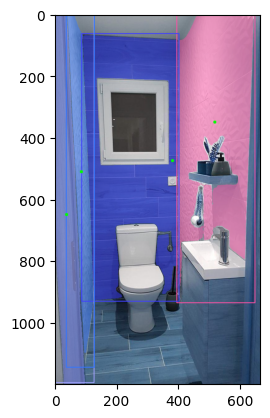

D:\3d-recon\MoGe\ASARoomImage\b15.jpg
walls_bbox [[1.2299557e+03 1.6803284e+00 1.5847899e+03 7.9040063e+02]
 [1.1737671e+00 1.3724365e+00 3.2769388e+02 7.9092279e+02]
 [3.2455573e+02 5.0244751e+00 6.3701923e+02 7.1824451e+02]
 [6.4980212e+02 5.3659058e+00 1.0518397e+03 7.1959186e+02]]
selected_wall_points [[1434, 319], [16, 331], [599, 326], [733, 391]]


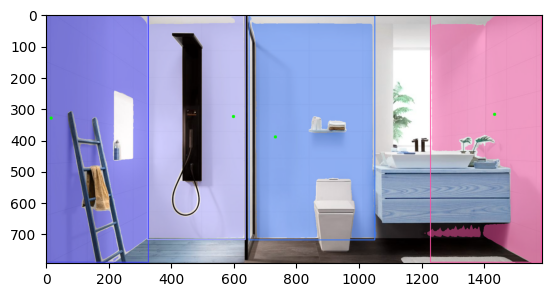

D:\3d-recon\MoGe\ASARoomImage\b18.jpg
walls_bbox [[1.5032501e+00 1.6946411e+00 2.8590643e+02 1.0150502e+03]
 [1.0333839e+03 5.6516602e+02 1.3618324e+03 1.0127125e+03]
 [7.5134088e+02 1.4220651e+02 1.0447860e+03 8.4546472e+02]
 [1.0363411e+03 8.9227295e-01 1.3611157e+03 5.7637286e+02]]
selected_wall_points [[137, 350], [1222, 725], [938, 613], [1215, 301]]


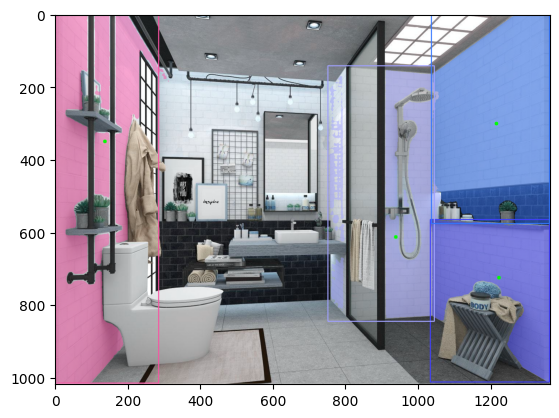

D:\3d-recon\MoGe\ASARoomImage\b19.jpg
walls_bbox [[ 4.3878174e-01  5.3872681e-01  2.1486795e+02  7.7056494e+02]
 [ 8.5043225e+02 -2.1316528e-01  1.1386537e+03  7.5405469e+02]
 [ 2.0722734e+02  6.1544281e+01  4.6824512e+02  6.2797119e+02]
 [ 5.5489368e+02  1.1178366e+02  7.4169714e+02  6.3549268e+02]]
selected_wall_points [[89, 383], [1139, 308], [237, 325], [647, 388]]


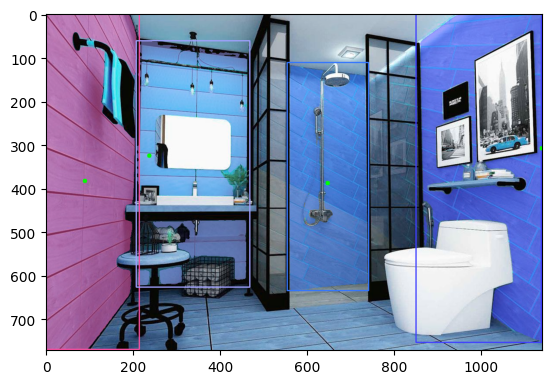

D:\3d-recon\MoGe\ASARoomImage\b20.jpg
walls_bbox [[5.3747559e-01 3.3004761e-01 2.1930652e+02 8.4907214e+02]
 [8.6604980e+02 3.7600708e-01 1.1381609e+03 8.4895801e+02]
 [6.7035931e+02 1.6921648e+02 8.7357306e+02 6.6716364e+02]
 [2.1617139e+02 8.8286072e+01 4.5699274e+02 7.2973608e+02]
 [4.6216296e+02 1.8176202e+02 6.7197583e+02 4.9740802e+02]]
selected_wall_points [[98, 393], [1125, 339], [681, 416], [340, 403], [639, 365]]


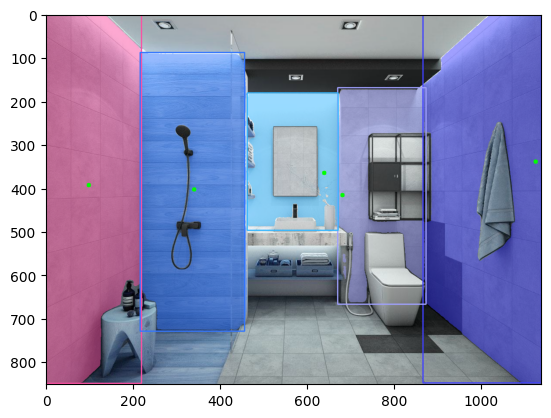

D:\3d-recon\MoGe\ASARoomImage\b21.jpg
walls_bbox [[8.3969128e+02 5.0277710e-01 1.1389690e+03 8.2290955e+02]
 [5.1090106e+02 6.9988159e+01 8.5188715e+02 6.2226843e+02]
 [2.7338770e+02 2.2814941e-01 5.1471362e+02 6.7351788e+02]
 [1.2358818e+00 1.9465637e-01 1.2654172e+02 4.8684082e+02]]
selected_wall_points [[949, 297], [672, 345], [401, 296], [56, 229]]


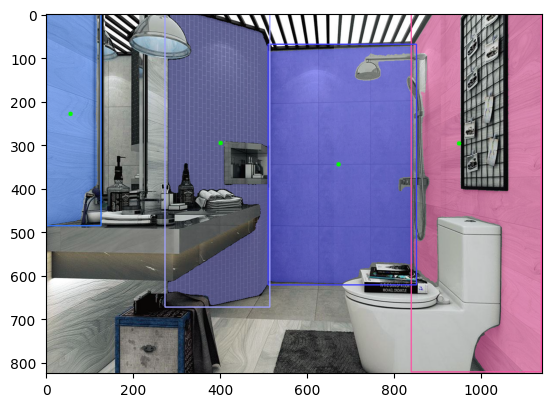

D:\3d-recon\MoGe\ASARoomImage\b22.jpg
walls_bbox [[ 8.4042358e-01  1.1117249e+00  1.7861255e+02  8.2634082e+02]
 [ 1.0708905e+03 -3.5470581e-01  1.1390895e+03  8.2803821e+02]
 [ 7.5785736e+02  4.3151855e-01  8.6958075e+02  5.7982373e+02]
 [ 5.1464355e+02  4.4335938e-01  7.6607507e+02  6.2655365e+02]
 [ 8.9426575e+02  3.4144415e+02  1.0465492e+03  8.2667889e+02]
 [ 2.0412724e+02  8.3953857e-01  4.8090143e+02  6.2304456e+02]]
selected_wall_points [[62, 339], [1116, 442], [802, 273], [635, 295], [1025, 453], [445, 248]]


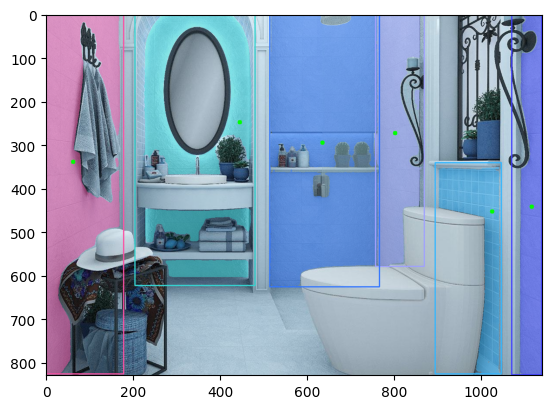

D:\3d-recon\MoGe\ASARoomImage\b23.jpg
walls_bbox [[4.1147614e-01 5.4861450e-01 1.0518843e+02 9.4471155e+02]
 [8.6730164e+02 5.8380127e-01 1.1379424e+03 5.5545227e+02]
 [9.9826096e+01 1.1038208e-01 4.7580652e+02 7.0782532e+02]
 [6.7230902e+02 3.9997705e+02 8.7864532e+02 7.0932800e+02]
 [9.8514832e+01 3.9580475e+02 4.8151062e+02 7.0739337e+02]]
selected_wall_points [[48, 458], [896, 318], [398, 121], [734, 521], [333, 427]]


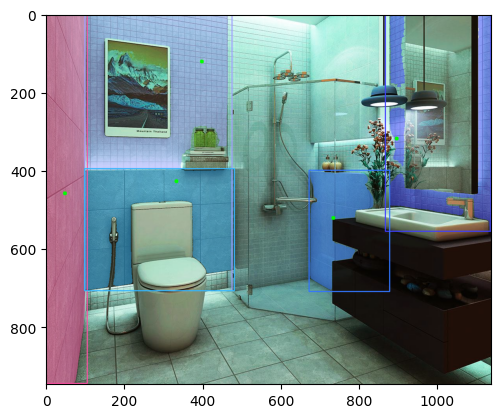

D:\3d-recon\MoGe\ASARoomImage\b24.jpg
walls_bbox [[5.8048657e+02 2.3541382e+01 7.1891821e+02 5.0273010e+02]
 [2.3088379e+00 4.8214722e-01 3.4495929e+02 5.2096997e+02]
 [5.3294373e-01 5.1196289e-01 1.5477130e+02 5.1584113e+02]]
selected_wall_points [[647, 275], [237, 268], [75, 222]]


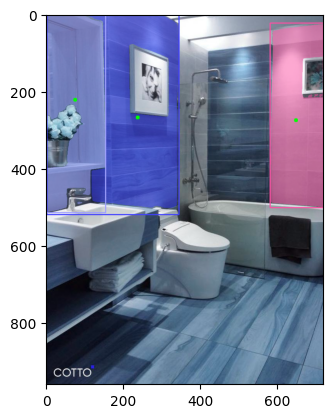

D:\3d-recon\MoGe\ASARoomImage\Bedroom.JPG
walls_bbox [[3.8772284e+02 1.3532104e+00 1.9953579e+03 8.4342596e+02]]
selected_wall_points [[1127, 267]]


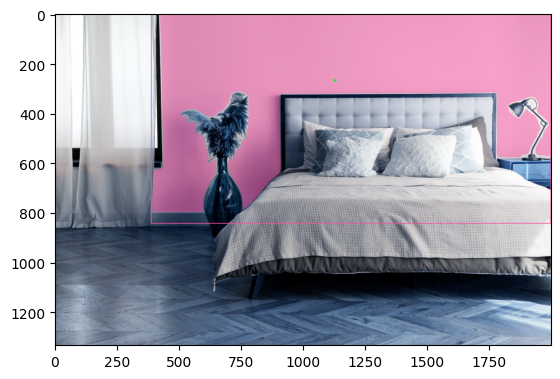

D:\3d-recon\MoGe\ASARoomImage\Bedroom2.JPG
walls_bbox [[1.6128845e+00 3.8519287e-01 9.4747998e+02 1.0576101e+03]
 [1.4419229e+03 7.7176422e+01 1.9976238e+03 1.0238474e+03]]
selected_wall_points [[362, 399], [1717, 475]]


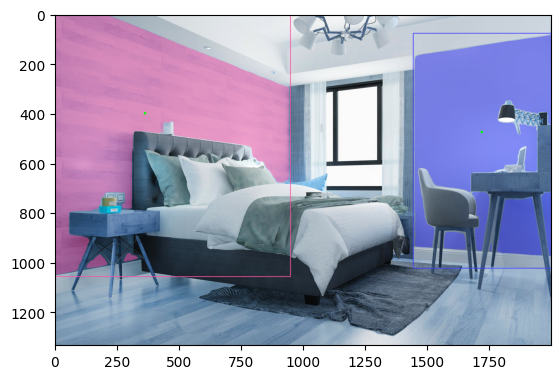

D:\3d-recon\MoGe\ASARoomImage\Bedroom3.JPG
walls_bbox [[ 4.0284787e+02  1.8930054e+02  8.4119360e+02  9.1342114e+02]
 [ 9.7576904e-01  3.9886475e-01  4.0459299e+02  7.7500592e+02]
 [ 1.7692993e+03 -3.2131348e+00  1.9978860e+03  1.3232760e+03]]
selected_wall_points [[817, 617], [24, 341], [1901, 493]]


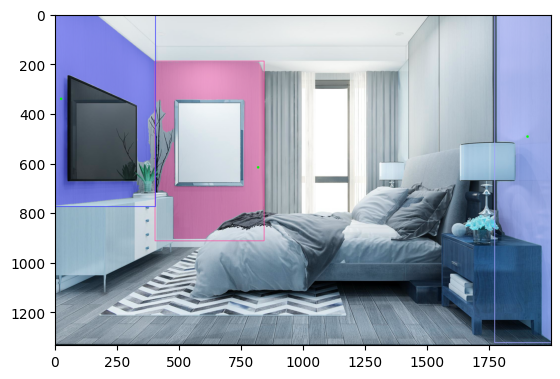

D:\3d-recon\MoGe\ASARoomImage\Bedroom4.JPG
walls_bbox [[ 1.6291199e+00 -1.5396118e-01  7.6838379e+02  7.9080664e+02]
 [ 1.5592117e+03  2.5729370e-01  1.8555154e+03  9.5414746e+02]
 [ 1.8516731e+03  6.7883301e-01  1.9965916e+03  1.2191954e+03]]
selected_wall_points [[363, 279], [1720, 489], [1931, 548]]


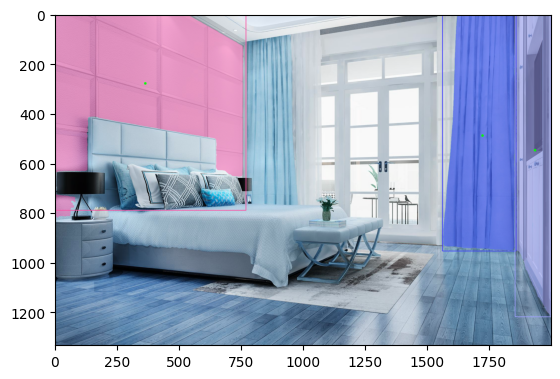

D:\3d-recon\MoGe\ASARoomImage\d01.jpg
walls_bbox [[6.5601599e+02 8.6408447e+01 7.3505151e+02 7.7707397e+02]
 [6.1955078e+01 1.4927524e+02 2.6268857e+02 7.3812061e+02]
 [2.6976013e-01 8.7592041e+01 6.3369186e+01 7.1568207e+02]
 [2.7869949e+02 1.4842525e+02 4.5722610e+02 5.3314227e+02]]
selected_wall_points [[702, 407], [172, 445], [36, 422], [365, 332]]


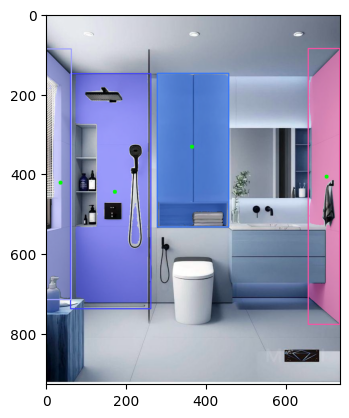

D:\3d-recon\MoGe\ASARoomImage\d02.jpg
walls_bbox [[567.22815    97.529144  734.72864   852.8662   ]
 [311.72565   133.02081   572.20404   837.74976  ]
 [  1.0629578  79.51422   572.80444   877.81995  ]
 [ 27.632767  603.0249    490.4823    920.45166  ]]
selected_wall_points [[639, 518], [424, 423], [148, 161], [274, 725]]


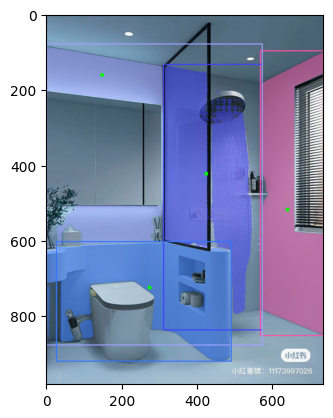

D:\3d-recon\MoGe\ASARoomImage\d03.jpg
walls_bbox [[1.6566772e+00 7.7447510e-01 6.3536469e+02 1.1500603e+03]
 [1.3585928e+03 1.7676300e+01 1.9180554e+03 8.0749414e+02]
 [6.2802869e+02 3.0725244e+02 1.3635653e+03 7.3191614e+02]]
selected_wall_points [[183, 499], [1694, 399], [963, 708]]


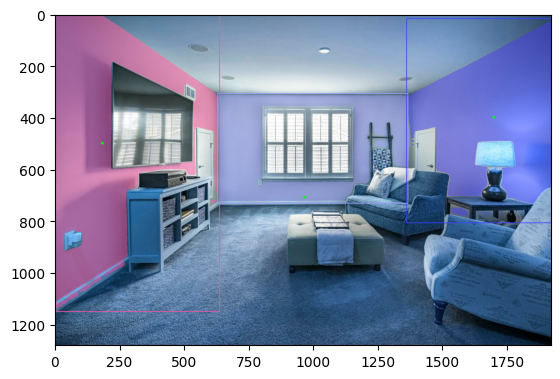

D:\3d-recon\MoGe\ASARoomImage\d04.jpg
walls_bbox [[5.1041260e+00 1.7661743e+00 1.9154834e+03 1.6975698e+03]]
selected_wall_points [[1345, 762]]


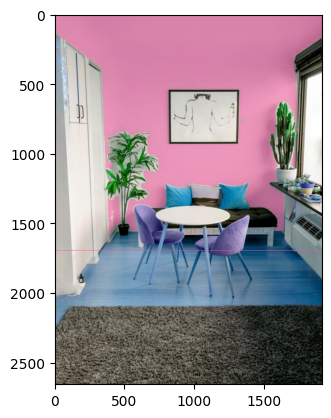

D:\3d-recon\MoGe\ASARoomImage\d05.jpg
walls_bbox [[1392.0017   290.52966 1917.0183   874.57776]
 [ 830.16125  414.0275   960.8053   679.73376]]
selected_wall_points [[1734, 510], [891, 534]]


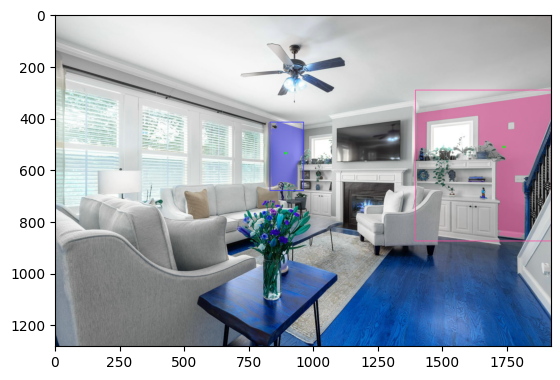

D:\3d-recon\MoGe\ASARoomImage\Image.jpg
walls_bbox [[ 616.58984    39.730225 2145.4595   1507.9506  ]]
selected_wall_points [[1358, 740]]


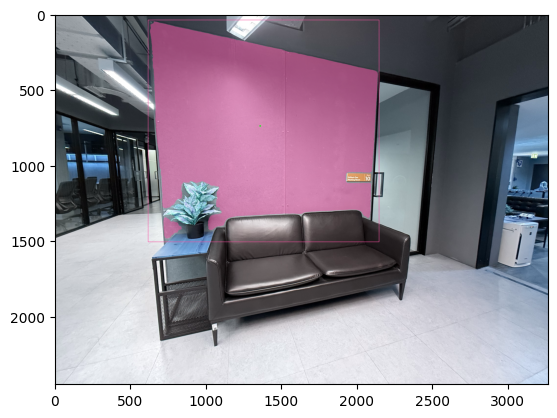

D:\3d-recon\MoGe\ASARoomImage\IMG_0041.JPG
walls_bbox [[2.1235715e+03 1.6635132e+00 3.3956462e+03 1.4779573e+03]
 [8.3161334e+02 6.0327051e+02 1.6991423e+03 1.1559441e+03]]
selected_wall_points [[2823, 775], [1272, 743]]


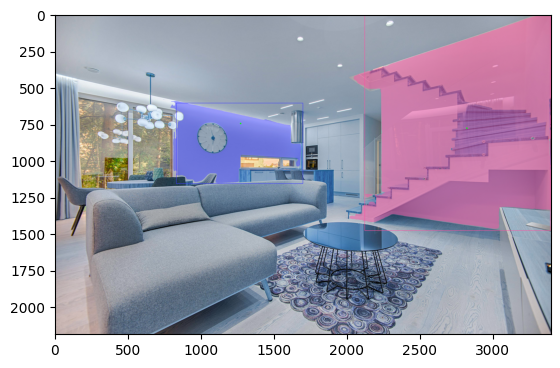

D:\3d-recon\MoGe\ASARoomImage\IMG_0042.PNG
walls_bbox [[7.4177222e+02 4.0777588e-01 1.0225038e+03 5.8385114e+02]
 [9.4834961e+01 5.0357880e+01 6.0132593e+02 5.4605908e+02]
 [5.9867664e+02 1.5544736e+02 7.1560059e+02 4.8308194e+02]]
selected_wall_points [[994, 121], [294, 261], [665, 299]]


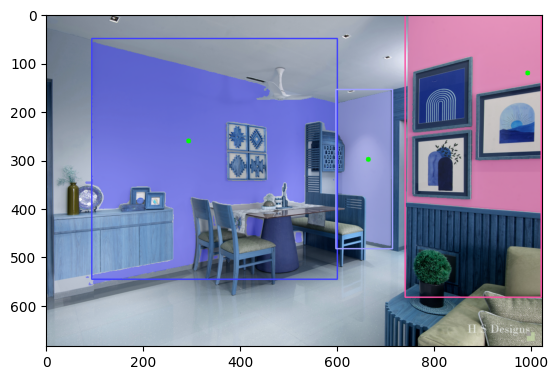

D:\3d-recon\MoGe\ASARoomImage\IMG_0043.JPG
walls_bbox [[4.6471240e+02 4.0374756e-01 1.0201249e+03 6.2786676e+02]
 [1.1481628e+00 4.7396851e-01 4.6794528e+02 7.6495374e+02]
 [1.1522120e+03 6.6394043e-01 1.3424154e+03 7.6612946e+02]
 [1.0148972e+03 5.9454346e-01 1.1501113e+03 7.0306580e+02]]
selected_wall_points [[758, 283], [172, 353], [1248, 381], [1089, 327]]


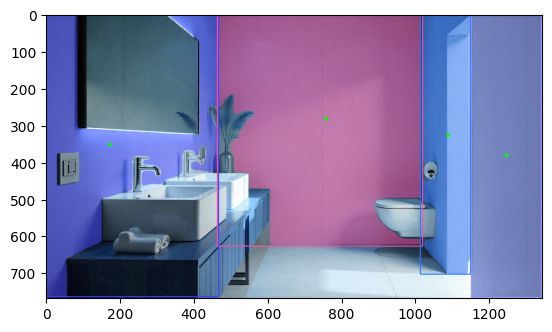

D:\3d-recon\MoGe\ASARoomImage\IMG_0044.JPG
walls_bbox [[5.3196716e-01 1.5744019e-01 1.5317282e+02 7.3368005e+02]
 [7.2557233e+02 2.0683891e+02 8.1838495e+02 5.2061908e+02]
 [1.5063110e+02 1.1427959e+02 2.3870377e+02 5.7168817e+02]
 [2.3628470e+02 1.9007181e+02 2.9396921e+02 5.7983569e+02]]
selected_wall_points [[66, 325], [771, 354], [193, 357], [263, 393]]


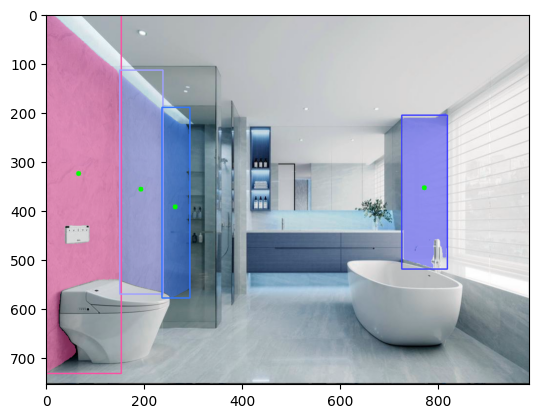

D:\3d-recon\MoGe\ASARoomImage\IMG_0045.JPG
walls_bbox [[1.8640352e+03 2.4774170e-01 2.5572593e+03 1.4845579e+03]
 [2.2277527e+00 1.6647339e+00 7.1588708e+02 1.0359363e+03]
 [1.0007103e+03 4.7257870e+02 1.4460240e+03 1.1186986e+03]
 [7.2884009e+02 4.7933737e+02 1.0042600e+03 1.1019479e+03]]
selected_wall_points [[2529, 596], [262, 560], [1222, 723], [873, 804]]


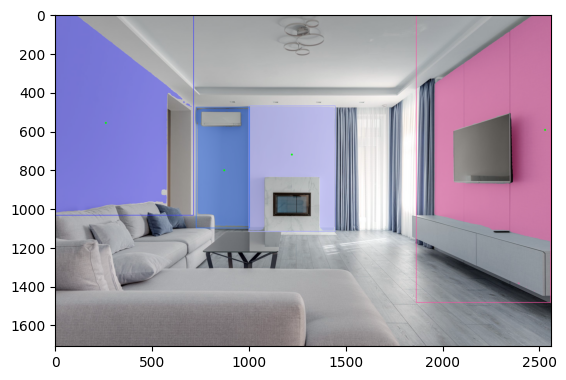

D:\3d-recon\MoGe\ASARoomImage\IMG_0046.JPG
walls_bbox [[4.2366943e+01 7.1765137e-01 6.1907568e+02 6.7305249e+02]
 [6.9015820e+02 1.0758511e+02 1.3979866e+03 5.5240662e+02]
 [1.0832488e+03 2.0658775e+02 1.3981519e+03 4.4231140e+02]
 [2.2627049e+02 1.8603578e+02 5.6138196e+02 4.4706226e+02]
 [2.8267770e+02 4.6397003e+02 6.3781348e+02 7.7245953e+02]]
selected_wall_points [[224, 282], [1052, 310], [1146, 319], [371, 344], [465, 611]]


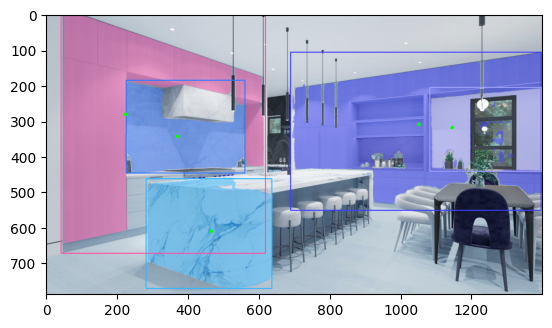

D:\3d-recon\MoGe\ASARoomImage\IMG_0047.JPG
walls_bbox [[1.0753313e+03 2.7206421e-01 1.3425750e+03 7.6564343e+02]
 [4.1203619e+02 8.5055542e-01 9.8823163e+02 5.8548975e+02]
 [1.0146790e+00 5.7507324e-01 4.1403625e+02 7.6271625e+02]]
selected_wall_points [[1210, 327], [636, 253], [207, 434]]


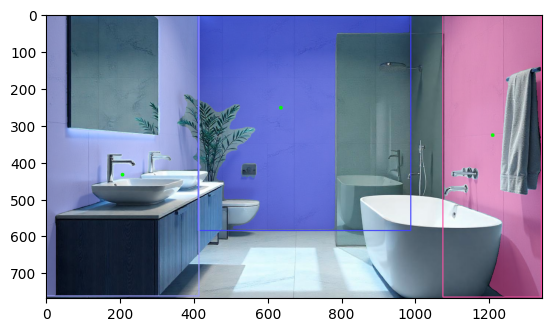

D:\3d-recon\MoGe\ASARoomImage\IMG_0105.JPG
walls_bbox [[ 788.09814    324.67096   1197.9285    1127.9521   ]
 [   1.2633972  208.10141    665.36865    901.50793  ]]
selected_wall_points [[1010, 732], [289, 496]]


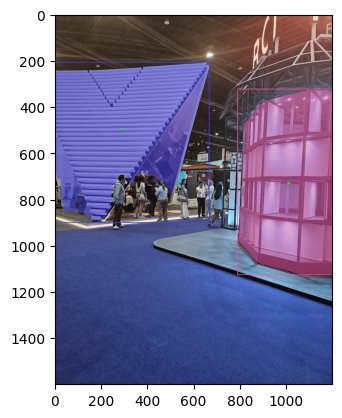

D:\3d-recon\MoGe\ASARoomImage\IMG_0122.PNG
walls_bbox [[1.2605896e+00 7.2436523e-01 3.4138727e+02 1.6336433e+03]
 [3.3499097e+02 2.5713968e+02 5.3260944e+02 1.2730551e+03]
 [5.2745386e+02 4.2286694e+02 6.5678418e+02 1.2898436e+03]
 [1.6165398e+03 4.6282822e+02 1.8237478e+03 1.1523319e+03]]
selected_wall_points [[150, 725], [431, 798], [588, 880], [1719, 779]]


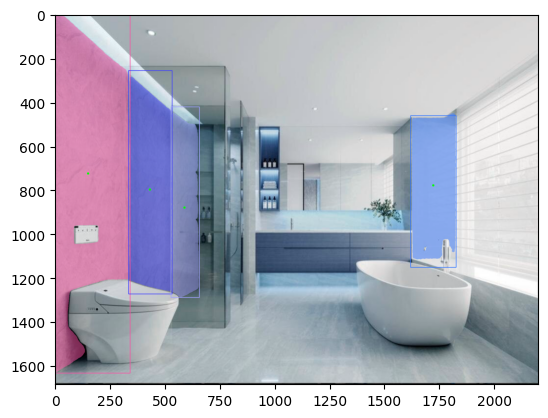

D:\3d-recon\MoGe\ASARoomImage\Kitchen (2).jpeg
walls_bbox [[ 8.7831116e-01  3.6706543e-01  2.1115826e+02  6.6921204e+02]
 [ 4.4247440e+02  2.1033885e+02  1.1200815e+03  3.3190350e+02]
 [ 1.2160112e+03 -7.7911377e-02  1.3428000e+03  7.6650464e+02]
 [ 1.1624639e+03  2.2720642e+00  1.2205320e+03  5.8434521e+02]]
selected_wall_points [[97, 318], [794, 261], [1284, 350], [1192, 294]]


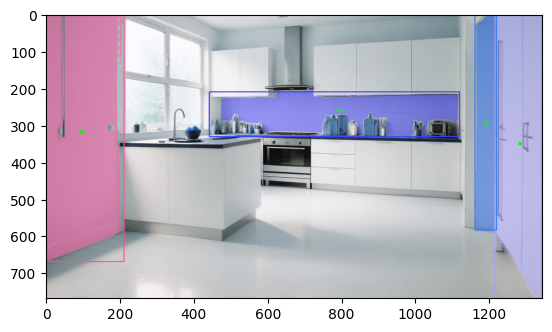

D:\3d-recon\MoGe\ASARoomImage\Kitchen (3).jpeg
walls_bbox [[8.5859604e+01 7.9376221e-01 2.3105910e+02 6.4842761e+02]
 [2.2596204e+02 3.4220703e+01 1.0776364e+03 6.0280548e+02]
 [1.0606115e+03 1.1581421e-01 1.3426644e+03 6.8251819e+02]
 [2.4801865e+02 4.5130795e+02 8.8717004e+02 6.8207556e+02]]
selected_wall_points [[150, 322], [629, 401], [1180, 243], [567, 568]]


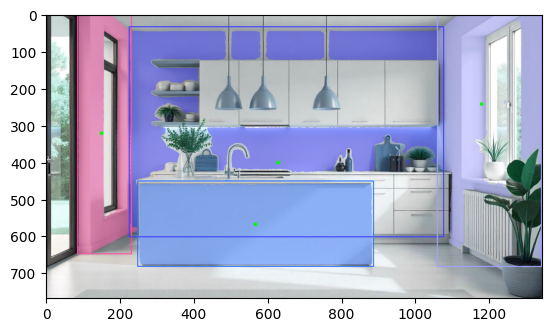

D:\3d-recon\MoGe\ASARoomImage\Kitchen (4).jpeg
walls_bbox [[1.0507028e+03 5.9271240e-01 1.3428563e+03 7.5631830e+02]
 [2.9164182e+02 1.2981172e+02 5.1146127e+02 5.6909613e+02]
 [5.1814099e+02 2.8514548e+02 1.0614111e+03 4.0781314e+02]]
selected_wall_points [[1254, 283], [402, 346], [771, 339]]


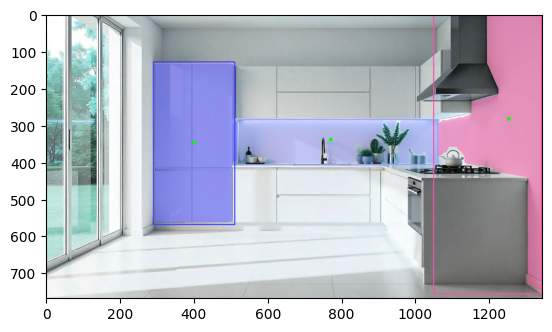

D:\3d-recon\MoGe\ASARoomImage\Kitchen (5).jpeg
walls_bbox [[ 455.203    312.16174 1019.2103   440.05127]]
selected_wall_points [[720, 367]]


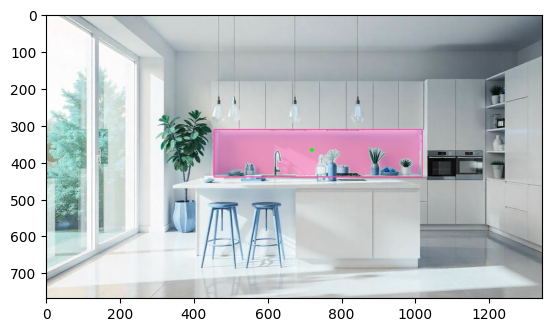

D:\3d-recon\MoGe\ASARoomImage\Kitchen.jpeg
walls_bbox [[1.8339444e+02 9.7928131e+01 1.0484728e+03 4.2996622e+02]
 [1.0533236e+03 6.8905640e-01 1.3427526e+03 7.1514294e+02]]
selected_wall_points [[497, 338], [1139, 189]]


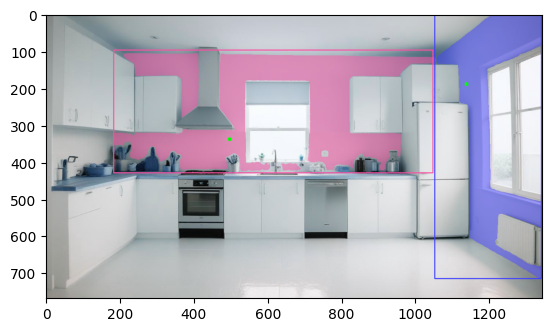

D:\3d-recon\MoGe\ASARoomImage\Kitchen.JPG
walls_bbox [[1.8694258e+03 1.0714722e+00 1.9982100e+03 1.2597852e+03]
 [1.6063999e+03 3.5574066e+01 1.8733809e+03 1.0315460e+03]
 [1.4303251e+03 2.1801334e+02 1.5298854e+03 9.7908533e+02]
 [8.6483765e-01 3.4746008e+02 4.8964493e+02 6.8651599e+02]
 [8.3381445e+02 2.0709271e+02 1.4835439e+03 9.7681940e+02]
 [1.1393433e+00 6.8679279e+02 6.4321252e+02 1.2752126e+03]]
selected_wall_points [[1937, 612], [1740, 533], [1485, 565], [199, 540], [1109, 404], [269, 918]]


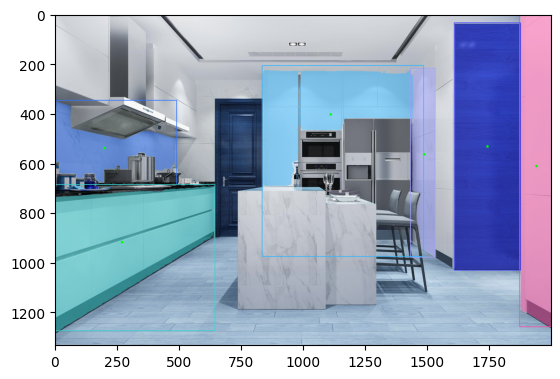

D:\3d-recon\MoGe\ASARoomImage\Kitchen2.JPG
walls_bbox [[1.9765930e+00 9.1027832e-01 5.6478674e+02 1.2465322e+03]
 [1.5492817e+03 1.1141357e+00 1.9970684e+03 1.3289175e+03]
 [7.5732190e+02 2.3623163e+02 1.2824747e+03 6.6137494e+02]]
selected_wall_points [[213, 555], [1784, 647], [1044, 260]]


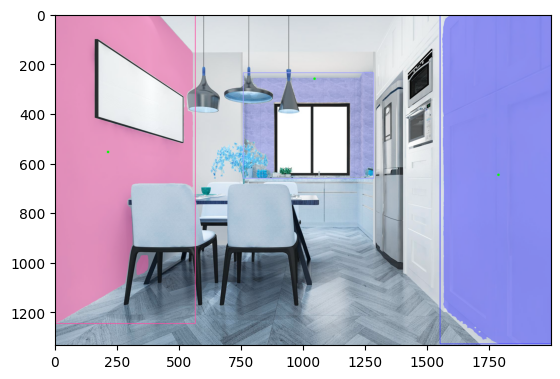

D:\3d-recon\MoGe\ASARoomImage\Kitchen3.JPG
walls_bbox [[2.2723218e+02 1.2529297e+00 1.8035625e+03 9.1801752e+02]]
selected_wall_points [[764, 723]]


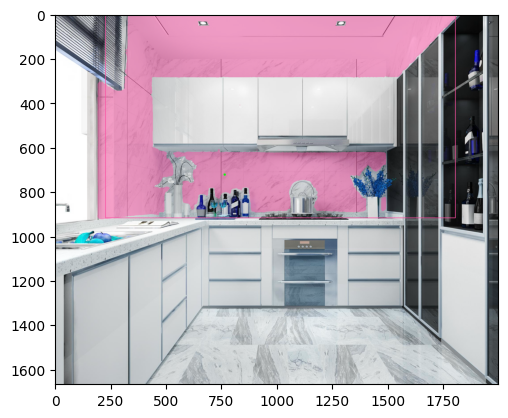

D:\3d-recon\MoGe\ASARoomImage\Kitchen4.JPG
walls_bbox [[5.4731128e+02 5.7156952e+01 7.3488147e+02 9.7443359e+02]
 [1.2877664e+02 2.8891116e+02 2.4288721e+02 5.6856885e+02]
 [2.4128217e+02 2.8910083e+02 5.4938373e+02 5.6709106e+02]
 [6.5146637e-01 2.9701599e+01 1.8650284e+02 4.7388425e+02]]
selected_wall_points [[654, 512], [205, 433], [394, 424], [108, 286]]


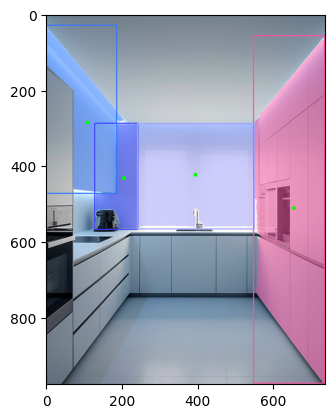

D:\3d-recon\MoGe\ASARoomImage\Living (2).jpeg
walls_bbox [[ 4.1006720e+02  1.9719849e+00  1.2418601e+03  4.9797809e+02]
 [ 1.1689362e+01 -7.0648193e-02  4.2630142e+02  4.1584982e+02]
 [ 1.2315034e+03  6.1257935e-01  1.3430039e+03  5.0779288e+02]]
selected_wall_points [[836, 220], [282, 149], [1285, 172]]


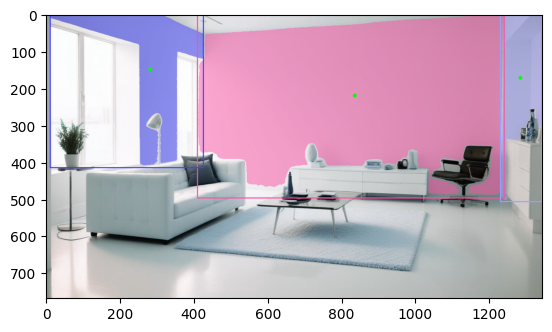

D:\3d-recon\MoGe\ASARoomImage\Living.jpeg
walls_bbox [[ 9.70031738e-01 -1.10809326e-01  3.52494293e+02  5.84731201e+02]
 [ 9.65074097e+02  2.38647461e-01  1.34297522e+03  5.84032959e+02]
 [ 3.50216187e+02  6.06302185e+01  9.68083496e+02  4.80545990e+02]]
selected_wall_points [[113, 250], [1110, 128], [729, 228]]


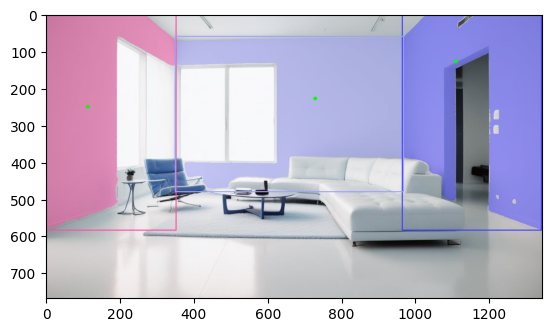

D:\3d-recon\MoGe\ASARoomImage\Living.JPG
walls_bbox [[1.4415204e+03 1.2642212e+00 1.9983500e+03 1.1572246e+03]
 [4.0739505e+02 1.5518597e+02 4.7373422e+02 8.9524603e+02]]
selected_wall_points [[1771, 454], [435, 524]]


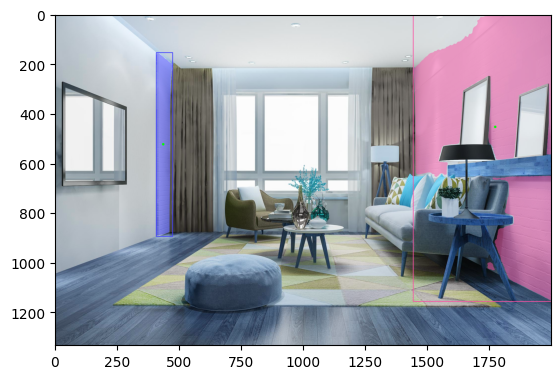

D:\3d-recon\MoGe\ASARoomImage\Living2.JPG
walls_bbox [[1.1119003e+00 6.8223694e+01 1.9876453e+02 6.2924225e+02]
 [1.2655581e+03 2.4850848e+02 1.7494583e+03 8.3584503e+02]
 [1.8850507e+02 9.5157074e+01 1.2688792e+03 8.5200049e+02]]
selected_wall_points [[98, 347], [1538, 471], [639, 448]]


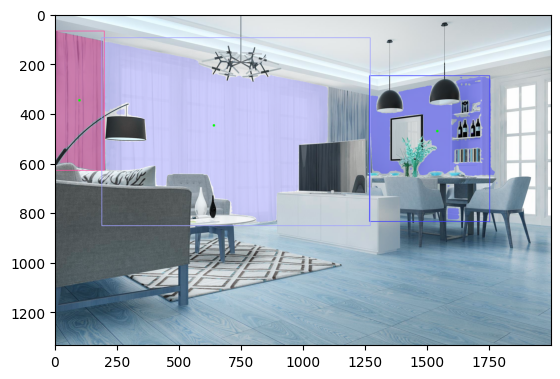

D:\3d-recon\MoGe\ASARoomImage\Living3.JPG
walls_bbox [[ 1.5224609e+00  4.0258789e-01  3.2395563e+02  1.2092744e+03]
 [ 3.1972833e+02  1.8383582e+02  9.7505011e+02  9.0590491e+02]
 [ 1.4532820e+03 -7.6293945e-03  1.9982764e+03  1.1014607e+03]]
selected_wall_points [[20, 305], [695, 532], [1621, 194]]


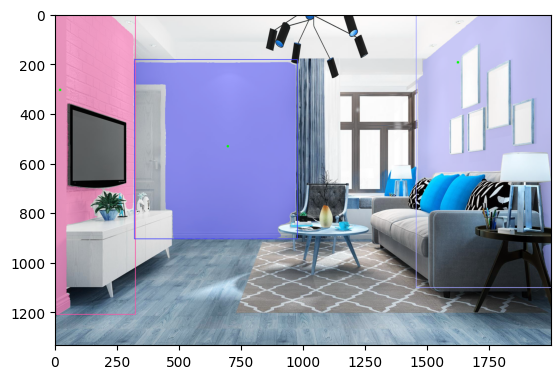

D:\3d-recon\MoGe\ASARoomImage\r02.jpg
walls_bbox [[1.2780024e+03 7.0925903e-01 1.4988384e+03 9.1893774e+02]
 [8.1851068e+02 9.1546631e-01 1.2920226e+03 8.0342572e+02]]
selected_wall_points [[1388, 394], [1030, 146]]


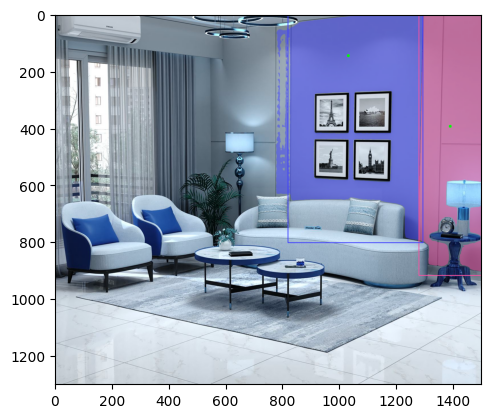

D:\3d-recon\MoGe\ASARoomImage\r13.jpg
walls_bbox [[1.00666809e+00 9.02435303e-01 4.21734985e+02 7.96417480e+02]
 [4.19398407e+02 1.62415527e+02 1.00755774e+03 5.30380188e+02]
 [1.00524237e+03 5.98867340e+01 1.19854907e+03 5.68082397e+02]
 [5.67234192e+01 2.82173279e+02 4.22032135e+02 7.74737122e+02]]
selected_wall_points [[159, 243], [752, 208], [1099, 294], [176, 463]]


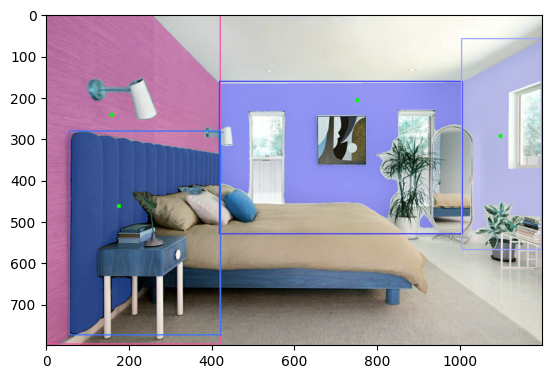

D:\3d-recon\MoGe\ASARoomImage\r14.jpg
walls_bbox [[9.7563354e+01 6.7709412e+01 6.5122528e+02 7.0201355e+02]
 [6.6906738e-01 4.6187103e+01 1.3695647e+02 7.4214722e+02]]
selected_wall_points [[297, 347], [42, 208]]


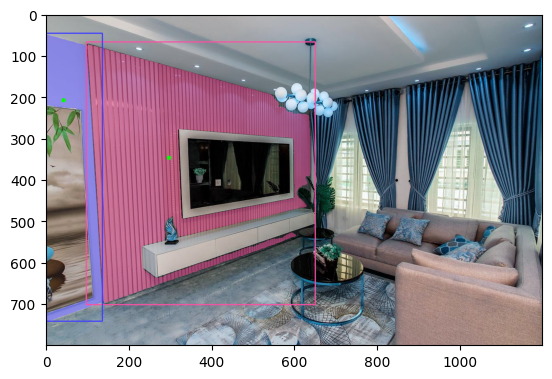

D:\3d-recon\MoGe\ASARoomImage\r15.jpg
walls_bbox [[2.2557014e+03 9.4909668e-02 2.9969148e+03 1.9690420e+03]
 [2.4690071e+03 8.7951660e-01 2.9963455e+03 1.5337443e+03]]
selected_wall_points [[2375, 927], [2720, 506]]


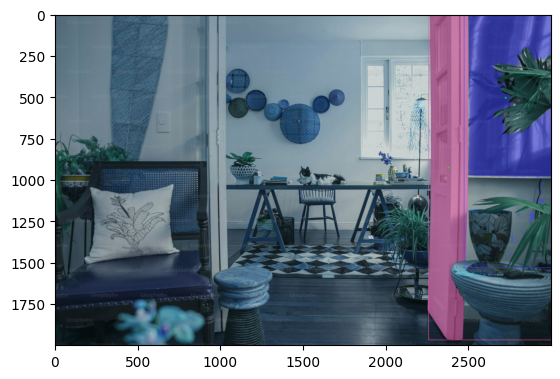

D:\3d-recon\MoGe\ASARoomImage\r16.jpg
walls_bbox [[2.8490244e+02 6.2968445e-01 9.2609399e+02 4.8767535e+02]]
selected_wall_points [[777, 193]]


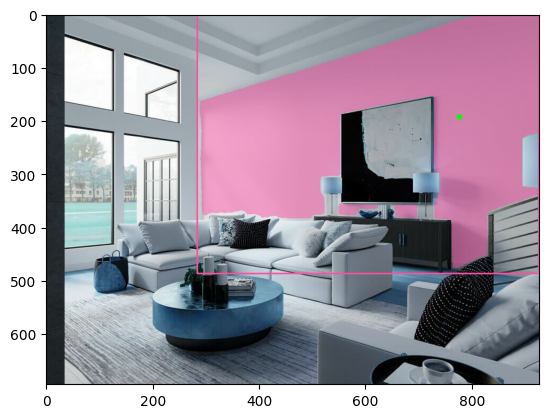

D:\3d-recon\MoGe\ASARoomImage\r17.jpg
walls_bbox [[5.4148022e+02 2.8651733e+00 1.1979453e+03 6.4226953e+02]
 [3.0663757e+01 8.9524139e+01 5.5616522e+02 5.8694128e+02]
 [2.2991371e-01 1.2445374e+00 3.7587379e+01 7.9719434e+02]]
selected_wall_points [[1181, 182], [219, 294], [15, 389]]


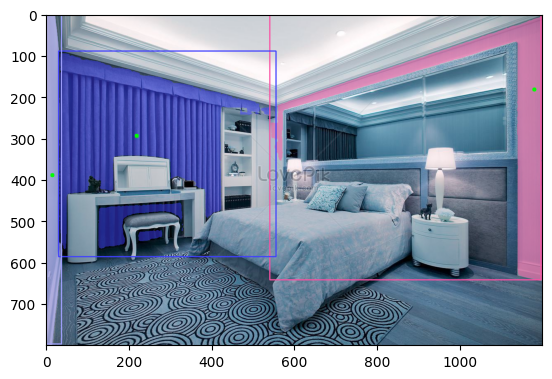

D:\3d-recon\MoGe\ASARoomImage\r21.jpg
walls_bbox [[9.7377014e-01 8.3681824e+01 3.9579364e+02 8.6091168e+02]
 [1.0623605e+03 9.4502563e+01 1.4982660e+03 8.7037097e+02]
 [3.9165967e+02 8.0525269e+01 1.0658805e+03 6.1488257e+02]]
selected_wall_points [[228, 547], [1401, 311], [625, 333]]


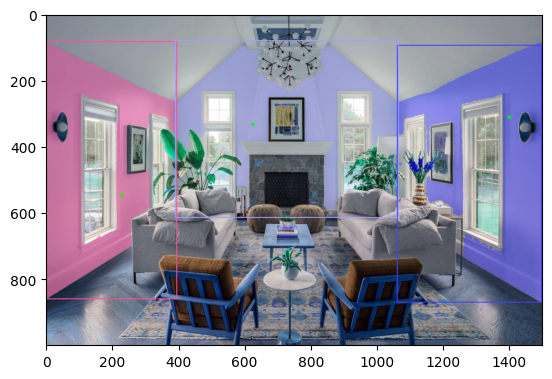

D:\3d-recon\MoGe\ASARoomImage\r23.jpg
walls_bbox [[5.8896277e+02 1.8388367e-01 1.0741084e+03 4.5341376e+02]]
selected_wall_points [[817, 205]]


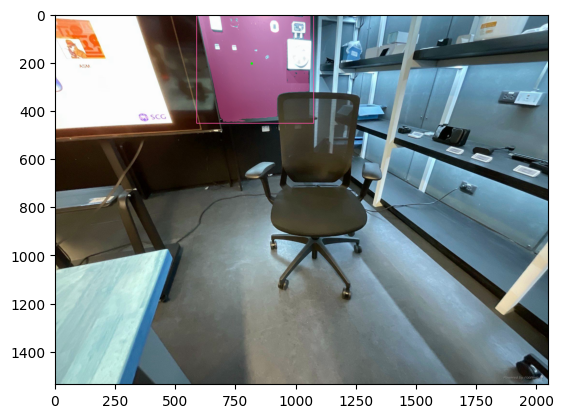

D:\3d-recon\MoGe\ASARoomImage\r24.jpg
walls_bbox [[ 556.25964     4.812744 4024.6587   2129.0933  ]]
selected_wall_points [[2820, 1239]]


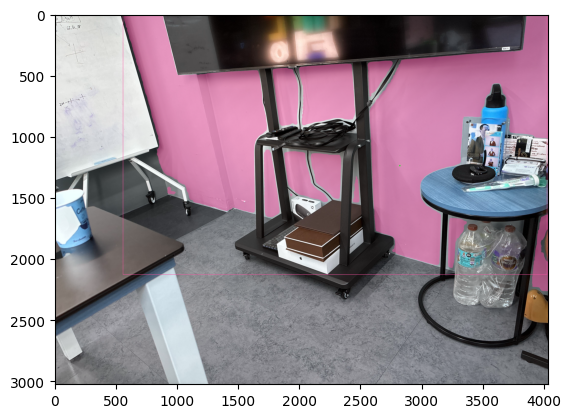

D:\3d-recon\MoGe\ASARoomImage\rr01.jpg
walls_bbox [[191.85535    42.362854  826.5709    473.4859   ]
 [804.3922      1.0122528 938.41064   509.4942   ]
 [191.92397    44.50229   229.28996   434.68494  ]
 [  1.494545    1.1963196 145.09668   537.44617  ]]
selected_wall_points [[571, 59], [859, 193], [209, 233], [10, 175]]


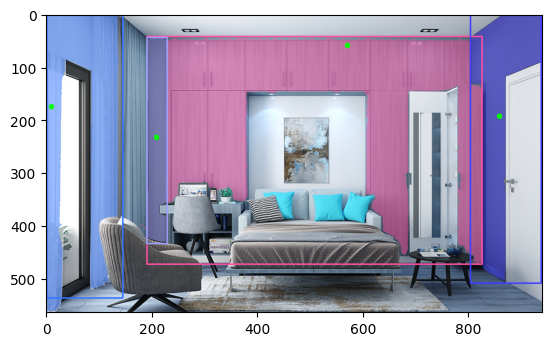

D:\3d-recon\MoGe\ASARoomImage\rr02.jpg
walls_bbox [[6.9815063e-01 1.7303717e+02 6.0847034e+02 8.5727594e+02]
 [6.0196912e+02 1.5772852e+02 1.0220796e+03 8.5161865e+02]]
selected_wall_points [[358, 350], [835, 539]]


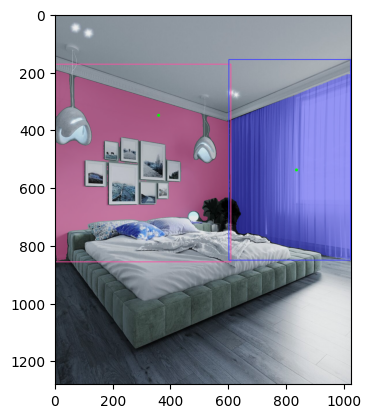

D:\3d-recon\MoGe\ASARoomImage\rr03.jpg
walls_bbox [[9.1999817e-01 8.5272217e-01 2.5154256e+02 1.1154189e+03]
 [2.2610110e+02 3.7868314e+02 1.2429890e+03 9.8752661e+02]]
selected_wall_points [[195, 685], [669, 645]]


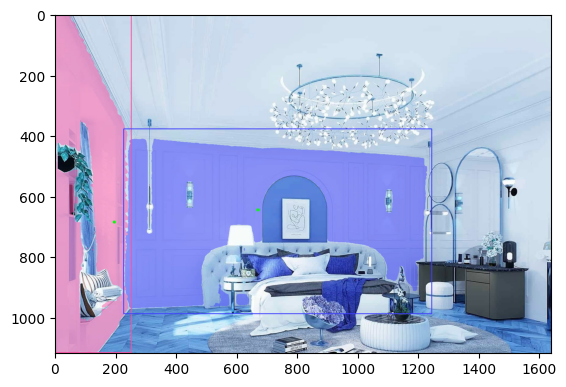

D:\3d-recon\MoGe\ASARoomImage\rr04.png
walls_bbox [[6.21619568e+02 4.70581055e-02 1.02300336e+03 5.10967499e+02]
 [6.18446472e+02 2.82842957e+02 1.02331195e+03 5.12504944e+02]
 [5.23399963e+02 5.55230637e+01 6.26430725e+02 2.96372223e+02]
 [2.03183174e-01 2.71450806e+00 2.32129784e+01 4.22139404e+02]]
selected_wall_points [[869, 249], [870, 346], [569, 152], [9, 222]]


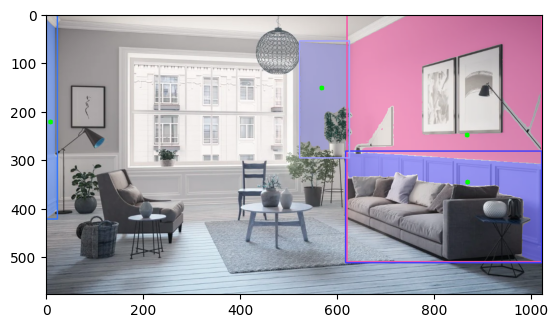

D:\3d-recon\MoGe\ASARoomImage\rr05.png
walls_bbox [[1.3680115e+00 8.7908936e-01 5.4904211e+02 1.0691594e+03]
 [8.7575031e+02 2.6630618e+02 1.2598003e+03 7.2027673e+02]
 [1.2448938e+03 4.2046814e+00 1.7233955e+03 8.2678979e+02]]
selected_wall_points [[215, 414], [1173, 412], [1604, 597]]


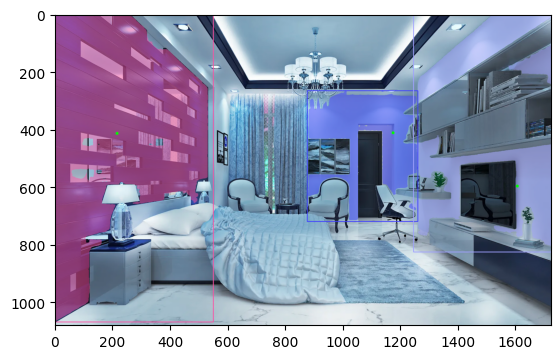

D:\3d-recon\MoGe\ASARoomImage\rr06.png
walls_bbox [[ 292.0582    216.50461  1106.9777    724.76697 ]
 [1334.7958     30.985535 1498.3861    743.5585  ]
 [1228.6472    134.9324   1339.7278    673.6814  ]
 [ 119.62656   197.76671   184.45352   614.1286  ]]
selected_wall_points [[740, 409], [1428, 381], [1290, 400], [151, 393]]


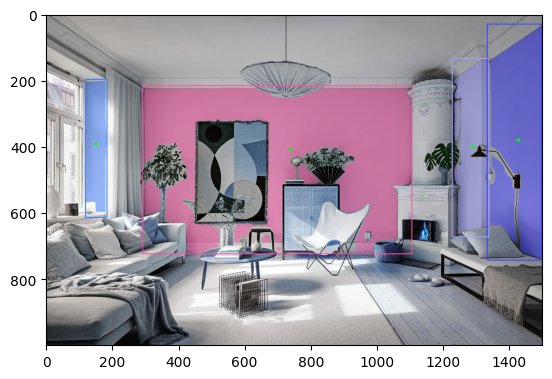

D:\3d-recon\MoGe\ASARoomImage\rr07.png
walls_bbox [[1124.5151   257.6529  1535.8096   892.5732 ]
 [ 157.31943    6.39563 1126.183    995.62115]
 [1531.2313   131.3852  1866.6886   901.22943]]
selected_wall_points [[1406, 420], [352, 498], [1683, 525]]


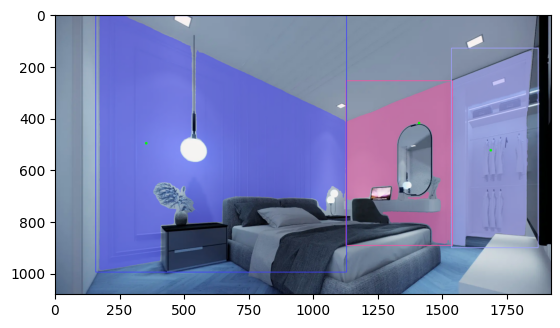

D:\3d-recon\MoGe\ASARoomImage\Toilet (2).jpeg
walls_bbox [[4.6471240e+02 4.0374756e-01 1.0201249e+03 6.2786676e+02]
 [1.1481628e+00 4.7396851e-01 4.6794528e+02 7.6495374e+02]
 [1.1522120e+03 6.6394043e-01 1.3424154e+03 7.6612946e+02]
 [1.0148972e+03 5.9454346e-01 1.1501113e+03 7.0306580e+02]]
selected_wall_points [[758, 283], [172, 353], [1248, 381], [1089, 327]]


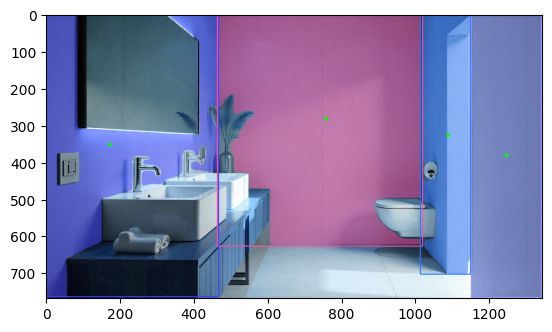

D:\3d-recon\MoGe\ASARoomImage\Toilet (3).jpeg
walls_bbox [[3.9420782e+02 5.6753540e-01 5.8505261e+02 6.3873242e+02]
 [9.9697473e+02 1.0637512e+00 1.3425050e+03 7.6579529e+02]
 [1.3623962e+00 6.1700439e-01 3.9731271e+02 7.6511041e+02]
 [5.8571875e+02 3.6599731e-01 9.3435449e+02 6.2278662e+02]]
selected_wall_points [[498, 281], [1180, 365], [151, 348], [678, 274]]


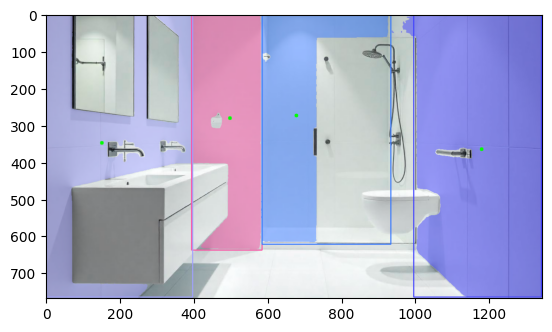

D:\3d-recon\MoGe\ASARoomImage\Toilet (4).jpeg
walls_bbox [[4.5304947e+02 4.7844238e+00 9.4137292e+02 6.2665283e+02]
 [1.3175430e+00 7.8430176e-01 2.3479443e+02 7.6602899e+02]
 [2.6436945e+02 9.3832397e-01 4.5665833e+02 7.6571265e+02]
 [9.4138971e+02 4.3285370e+00 1.3378545e+03 3.4680334e+02]
 [9.4114728e+02 3.2198322e+02 1.3362841e+03 5.2650079e+02]]
selected_wall_points [[678, 295], [105, 359], [358, 361], [1137, 174], [1164, 402]]


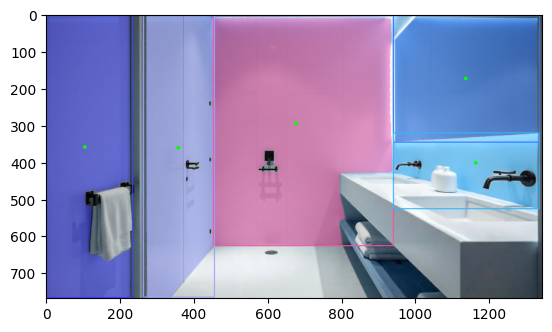

D:\3d-recon\MoGe\ASARoomImage\Toilet (5).jpeg
walls_bbox [[1.0753313e+03 2.7206421e-01 1.3425750e+03 7.6564343e+02]
 [4.1203619e+02 8.5055542e-01 9.8823163e+02 5.8548975e+02]
 [1.0146790e+00 5.7507324e-01 4.1403625e+02 7.6271625e+02]]
selected_wall_points [[1210, 327], [636, 253], [207, 434]]


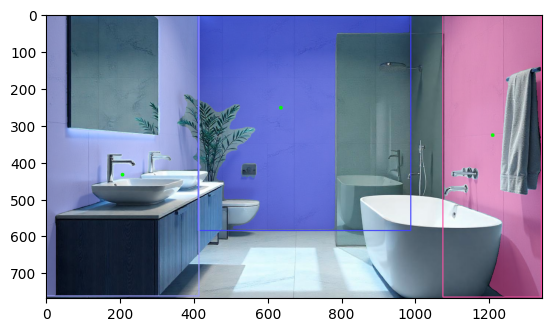

D:\3d-recon\MoGe\ASARoomImage\Toilet (6).jpeg
walls_bbox [[1.0363551e+03 6.3525391e-01 1.3428793e+03 7.6503833e+02]
 [1.2230682e+00 6.7431641e-01 3.4604156e+02 7.6526276e+02]
 [2.9361786e+02 8.3968109e+01 5.9948071e+02 6.3032947e+02]
 [7.8883490e+02 1.6502380e+00 1.0400710e+03 6.0232495e+02]]
selected_wall_points [[1100, 296], [131, 410], [462, 339], [922, 168]]


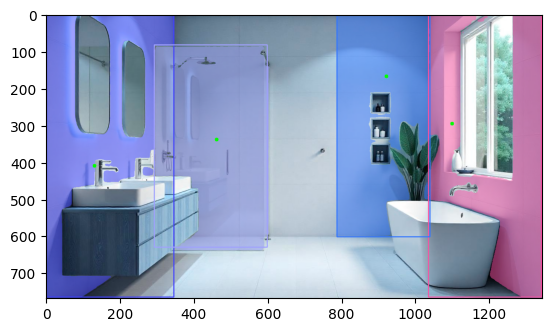

D:\3d-recon\MoGe\ASARoomImage\Toilet (7).jpeg
walls_bbox [[3.8179749e+02 5.4154419e+01 1.0065054e+03 5.8097498e+02]
 [1.0023704e+03 2.3028564e-01 1.3424409e+03 7.6247479e+02]
 [1.1164551e+00 9.9377441e-01 3.8395667e+02 7.5822943e+02]]
selected_wall_points [[693, 258], [1042, 485], [164, 433]]


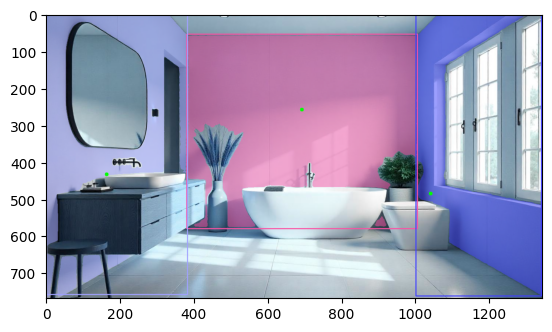

D:\3d-recon\MoGe\ASARoomImage\Toilet.jpeg
walls_bbox [[1.0963052e+03 5.1489258e-01 1.3425046e+03 7.0872351e+02]
 [3.9207388e+02 4.2593384e-01 1.1003141e+03 5.6587085e+02]
 [9.9166870e-01 9.0127563e-01 3.9648410e+02 7.6475281e+02]]
selected_wall_points [[1235, 272], [726, 258], [196, 382]]


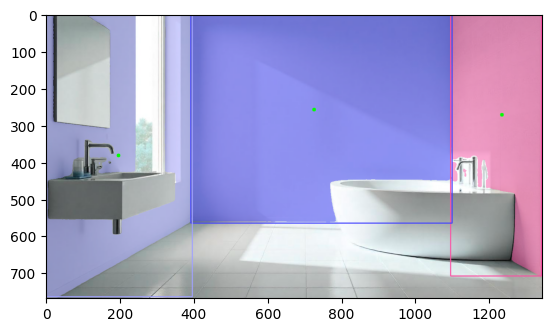

D:\3d-recon\MoGe\ASARoomImage\wedo1.png
walls_bbox [[ 190.24081  345.49005  809.95044  913.7248 ]
 [ 806.41907  348.78854 1133.507    941.3347 ]]
selected_wall_points [[499, 614], [960, 606]]


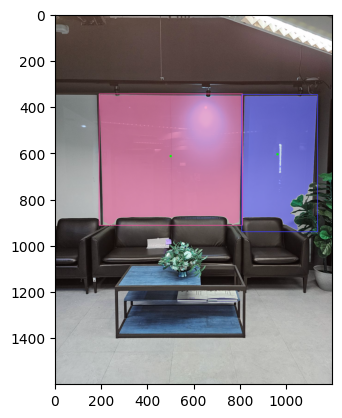

In [8]:
BOX_THRESHOLD = 0.25
TEXT_THRESHOLD = 0.25
NMS_THRESHOLD = 0.8

CLASSES = ["walls."]

SOURCE_PATH = rf"D:\3d-recon\MoGe\ASARoomImage"
images = os.listdir(SOURCE_PATH)

for img in images:

    SOURCE_IMAGE_PATH = rf"D:\3d-recon\MoGe\ASARoomImage\{img}"

    print(SOURCE_IMAGE_PATH)

    if os.path.exists(SOURCE_IMAGE_PATH):
        
        ######################### DO GROUNDING DETECTION ##########################
        # load image
        image = cv2.imread(SOURCE_IMAGE_PATH)

        # detect objects
        detections = grounding_dino_model.predict_with_classes(
            image=image,
            classes=CLASSES,
            box_threshold=BOX_THRESHOLD,
            text_threshold=TEXT_THRESHOLD
        )

        # # annotate image with detections
        box_annotator = sv.BoxAnnotator(color_lookup = ColorLookup.INDEX)
        labels = [
            f"{CLASSES[class_id]} {confidence:0.2f}" 
            for _, _, confidence, class_id, _, _ 
            in detections]
        
        # print("labels", labels)
        # print(f"Before NMS: {len(detections.xyxy)} boxes")
        annotated_frame = box_annotator.annotate(scene=image.copy(), detections=detections)#, labels=labels)
        # plt.imshow(annotated_frame)
        # plt.show()

        # print("torch.from_numpy(detections.xyxy)", torch.from_numpy(detections.xyxy).dtype)
        # print("torch.from_numpy(detections.confidence)", torch.from_numpy(detections.confidence).dtype)
        
        ############################################################################
        ######################### DO NMS POSTPROCESSING ##########################
        # NMS post process
        nms_idx = torchvision.ops.nms(
            torch.from_numpy(detections.xyxy), 
            torch.from_numpy(detections.confidence), 
            NMS_THRESHOLD
        ).numpy().tolist()


        detections.xyxy = detections.xyxy[nms_idx]
        detections.confidence = detections.confidence[nms_idx]
        detections.class_id = detections.class_id[nms_idx]

        # print(f"After NMS: {len(detections.xyxy)} boxes")

        box_annotator = sv.BoxAnnotator(color_lookup = ColorLookup.INDEX)
        annotated_frame = box_annotator.annotate(scene=image.copy(), detections=detections)
        # plt.imshow(annotated_frame)
        # plt.show()
        
        #############################################################################
        ######################### DO SAM SEGMENTATION ###############################

        # Prompting SAM with detected boxes
        def segment(sam_predictor: SamPredictor, image: np.ndarray, xyxy: np.ndarray) -> np.ndarray:
            sam_predictor.set_image(image)
            result_masks = []
            for box in xyxy:
                masks, scores, logits = sam_predictor.predict(
                    box=box,
                    multimask_output=True
                )
                index = np.argmax(scores)
                result_masks.append(masks[index])
            return np.array(result_masks)


        # convert detections to masks
        detections.mask = segment(
            sam_predictor=sam_predictor,
            image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
            xyxy=detections.xyxy
        )

        # print("ALL SAM Segmentations from GroundingDINO BBOX")
        box_annotator = sv.BoxAnnotator(color_lookup = ColorLookup.INDEX)
        mask_annotator = sv.MaskAnnotator(color_lookup = ColorLookup.INDEX)
        annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)
        annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)#, labels=labels)
        # plt.imshow(annotated_image)
        # plt.show()

        ################################################################################################
        # FILTER MASKS #
        ################################################################################################
        # First remove small masks (< 10% image area)
        filtered_masks, filtered_boxes = filter_small_masks(
                                                            masks=detections.mask,
                                                            boxes=detections.xyxy,
                                                            image_shape=image.shape[:2],  # (H, W)
                                                            min_area_ratio=0.01
                                                        )

        filtered_masks, filtered_boxes = filter_noisy_masks(filtered_masks,
                                                            filtered_boxes,
                                                            max_components=20,
                                                            min_component_area=10)


        final_masks, final_boxes = remove_masks_that_contain_others(
                                                                    masks=filtered_masks,
                                                                    boxes=filtered_boxes,
                                                                    threshold=0.9
                                                                    )
        ################################################################################################
        ################################################################################################

        detections.mask = final_masks
        detections.xyxy = final_boxes

        # print("FILTERED SAM Segmentations from GroundingDINO BBOX")
        # annotate image with detections
        box_annotator = sv.BoxAnnotator(color_lookup = ColorLookup.INDEX)
        mask_annotator = sv.MaskAnnotator(color_lookup = ColorLookup.INDEX)
        labels = [
            f"{CLASSES[class_id]} {confidence:0.2f}" 
            for _, _, confidence, class_id, _, _ 
            in detections]
        annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)
        annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)#, labels=labels)
        # print(labels)
        # plt.imshow(annotated_image)
        # plt.show()


        ################################################################################################
        ################################################################################################
        selected_points = []
        for i, mask in enumerate(final_masks):  # mask: (H, W) binary
            mask_uint8 = mask.astype(np.uint8)

            # Compute center from moments
            moments = cv2.moments(mask_uint8)
            if moments["m00"] != 0:
                original_cx = int(moments["m10"] / moments["m00"])
                original_cy = int(moments["m01"] / moments["m00"])
            else:
                ys, xs = np.where(mask)
                original_cx = int(np.mean(xs))
                original_cy = int(np.mean(ys))

            cx, cy = original_cx, original_cy

            if not mask[cy, cx]:
                ys, xs = np.where(mask)
                distances = np.sqrt((xs - cx)**2 + (ys - cy)**2)

                # Get index of 25th percentile closest point
                percentile_index = int(len(distances) * 0.2)
                sorted_indices = np.argsort(distances)

                idx = sorted_indices[percentile_index]
                cx, cy = int(xs[idx]), int(ys[idx])

            # Draw center (green)
            cv2.circle(annotated_image, (cx, cy), radius=5, color=(0, 255, 0), thickness=-1)

            selected_points.append([cx, cy])

            # Draw original center (red)
            # cv2.circle(annotated_image, (original_cx, original_cy), radius=4, color=(0, 0, 255), thickness=2)

            # Draw line (blue)
            # cv2.line(annotated_image, (original_cx, original_cy), (cx, cy), color=(255, 0, 0), thickness=1)
        ################################################################################################
        ################################################################################################


        # save the annotated grounded-sam image
        # cv2.imwrite(os.path.join("./output/BEST_wall_masks/", f"{img[:-4]}_wall.jpg"), annotated_image)
        # print("WITH BBOX CENTER POINTS")

        print("walls_bbox", detections.xyxy)
        print("selected_wall_points", selected_points)
        
        plt.imshow(annotated_image)
        plt.show()
        
        # for idx, mask in enumerate(detections.mask):
        #     mask_uint8 = (mask.astype(np.uint8)) * 255
        #     cv2.imwrite(os.path.join("./output/BEST_wall_masks/", f"{img[:-4]}_{idx}_wall_mask.jpg"), mask_uint8)


        

In [9]:
# BOX_THRESHOLD = 0.25
# TEXT_THRESHOLD = 0.25
# NMS_THRESHOLD = 0.8

# CLASSES = ["walls."]

# SOURCE_PATH = rf"E:\3d-recon\MoGe\ASARoomImage"
# images = os.listdir(SOURCE_PATH)

# for img in images:

#     SOURCE_IMAGE_PATH = rf"E:\3d-recon\MoGe\ASARoomImage\{img}"

#     print(SOURCE_IMAGE_PATH)

#     if os.path.exists(SOURCE_IMAGE_PATH):
        
#         ######################### DO GROUNDING DETECTION ##########################
#         # load image
#         image = cv2.imread(SOURCE_IMAGE_PATH)

#         # detect objects
#         detections = grounding_dino_model.predict_with_classes(
#             image=image,
#             classes=CLASSES,
#             box_threshold=BOX_THRESHOLD,
#             text_threshold=TEXT_THRESHOLD
#         )

#         # # annotate image with detections
#         box_annotator = sv.BoxAnnotator(color_lookup = ColorLookup.INDEX)
#         labels = [
#             f"{CLASSES[class_id]} {confidence:0.2f}" 
#             for _, _, confidence, class_id, _, _ 
#             in detections]
        
#         print("labels", labels)
#         print(f"Before NMS: {len(detections.xyxy)} boxes")
#         annotated_frame = box_annotator.annotate(scene=image.copy(), detections=detections)#, labels=labels)
#         # plt.imshow(annotated_frame)
#         # plt.show()

#         # print("torch.from_numpy(detections.xyxy)", torch.from_numpy(detections.xyxy).dtype)
#         # print("torch.from_numpy(detections.confidence)", torch.from_numpy(detections.confidence).dtype)
        
#         ############################################################################
#         ######################### DO NMS POSTPROCESSING ##########################
#         # NMS post process
#         nms_idx = torchvision.ops.nms(
#             torch.from_numpy(detections.xyxy), 
#             torch.from_numpy(detections.confidence), 
#             NMS_THRESHOLD
#         ).numpy().tolist()


#         detections.xyxy = detections.xyxy[nms_idx]
#         detections.confidence = detections.confidence[nms_idx]
#         detections.class_id = detections.class_id[nms_idx]

#         print(f"After NMS: {len(detections.xyxy)} boxes")

#         box_annotator = sv.BoxAnnotator(color_lookup = ColorLookup.INDEX)
#         annotated_frame = box_annotator.annotate(scene=image.copy(), detections=detections)
#         # plt.imshow(annotated_frame)
#         # plt.show()
        
#         #############################################################################
#         ######################### DO SAM SEGMENTATION ###############################

#         # Prompting SAM with detected boxes
#         def segment(sam_predictor: SamPredictor, image: np.ndarray, xyxy: np.ndarray) -> np.ndarray:
#             sam_predictor.set_image(image)
#             result_masks = []
#             for box in xyxy:
#                 masks, scores, logits = sam_predictor.predict(
#                     box=box,
#                     multimask_output=True
#                 )
#                 index = np.argmax(scores)
#                 result_masks.append(masks[index])
#             return np.array(result_masks)


#         # convert detections to masks
#         detections.mask = segment(
#             sam_predictor=sam_predictor,
#             image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
#             xyxy=detections.xyxy
#         )

#         print("ALL SAM Segmentations from GroundingDINO BBOX")
#         box_annotator = sv.BoxAnnotator(color_lookup = ColorLookup.INDEX)
#         mask_annotator = sv.MaskAnnotator(color_lookup = ColorLookup.INDEX)
#         annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)
#         annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)#, labels=labels)
#         # plt.imshow(annotated_image)
#         # plt.show()

#         ################################################################################################
#         # FILTER MASKS #
#         ################################################################################################
#         # First remove small masks (< 10% image area)
#         filtered_masks, filtered_boxes = filter_small_masks(
#                                                             masks=detections.mask,
#                                                             boxes=detections.xyxy,
#                                                             image_shape=image.shape[:2],  # (H, W)
#                                                             min_area_ratio=0.01
#                                                         )

#         filtered_masks, filtered_boxes = filter_noisy_masks(filtered_masks,
#                                                             filtered_boxes,
#                                                             max_components=20,
#                                                             min_component_area=10)


#         final_masks, final_boxes = remove_masks_that_contain_others(
#                                                                     masks=filtered_masks,
#                                                                     boxes=filtered_boxes,
#                                                                     threshold=0.9
#                                                                     )
#         ################################################################################################
#         ################################################################################################

#         detections.mask = final_masks
#         detections.xyxy = final_boxes

#         print("FILTERED SAM Segmentations from GroundingDINO BBOX")
#         # annotate image with detections
#         # box_annotator = sv.BoxAnnotator(color_lookup = ColorLookup.INDEX)
#         mask_annotator = sv.MaskAnnotator(color_lookup = ColorLookup.INDEX)
#         labels = [
#             f"{CLASSES[class_id]} {confidence:0.2f}" 
#             for _, _, confidence, class_id, _, _ 
#             in detections]
#         annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)
#         # annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)#, labels=labels)
#         print(labels)
#         # plt.imshow(annotated_image)
#         # plt.show()

#         ################################################################################################
#         ################################################################################################
#         for i, mask in enumerate(final_masks):  # mask: (H, W) binary
#             sampled_pts = sample_random_points_from_mask(mask, num_points=3)

#             for (x, y) in sampled_pts:
#                 cv2.circle(annotated_image, (x, y), radius=4, color=(0, 255, 255), thickness=-1)
#         ################################################################################################
#         ################################################################################################


#         # save the annotated grounded-sam image
#         cv2.imwrite(os.path.join("./output/BEST_wall_masks/", f"walls_annotated_{img[:-4]}.jpg"), annotated_image)
#         print("FILTERED SAM Segmentations from GroundingDINO BBOX")
#         print("WITH BBOX CENTER POINTS")

#         import matplotlib.pyplot as plt
#         plt.imshow(annotated_image)
#         plt.show()



#     break
